<a href="https://colab.research.google.com/github/nurainizafiraaa/Final-Project-Data-Analyst-/blob/main/Zafira_Nurani__Final_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Data Analyst Final Project : Analysis for Online Sales Dataset - Popular Marketplace Data**




**Background:**
Dalam konteks transisi energi global, pemahaman mendalam terhadap tren konsumsi energi dan pergeseran sumber energi menjadi kunci bagi pemerintah, pelaku industri, dan organisasi internasional untuk merancang kebijakan dan strategi keberlanjutan. Data historis konsumsi energi yang mencakup berbagai negara, jenis sumber energi, dan periode waktu memberikan peluang untuk mengidentifikasi pola penggunaan, memantau perkembangan energi terbarukan, serta mengantisipasi lonjakan permintaan. <br>
Melalui analisis data konsumsi energi global dari 2000 hingga 2024, yang mencakup dimensi waktu, wilayah, dan jenis energi, diharapkan kita dapat menemukan potensi efisiensi, peluang investasi, dan arah kebijakan yang tepat untuk mendukung ketahanan energi jangka panjang.

**Tujuan:**
1. Menganalisis tren konsumsi energi dari waktu ke waktu untuk mengidentifikasi pola pertumbuhan, penurunan, atau peralihan sumber energi.
2. Melakukan segmentasi negara berdasarkan karakteristik pola konsumsi dan transisi energi yang serupa.
3. Melihat korelasi antara konsumsi energi dengan emisi karbon.
4. Mengidentifikasi negara atau wilayah dengan pertumbuhan konsumsi energi paling cepat sebagai target prioritas investasi atau kebijakan.
5. Memprediksi bagaimana konsumsi energi secara global dalam beberapa tahun ke depan.


**Data Information:**

Column Description *(from Kaggle)*

* Country / Region: Nama negara atau wilayah yang menjadi unit pengamatan.
* Year: Tahun observasi (dari 2000 hingga 2024).
* Total Energy Consumption: Konsumsi energi total (biasanya dalam satuan seperti TJ, PJ, atau Mtoe).
* Energy Type - Fossil Fuels: Konsumsi dari sumber bahan bakar fosil.
* Energy Type - Renewables: Konsumsi dari sumber energi terbarukan.
* Energy Type - Nuclear (jika tersedia): Konsumsi dari energi nuklir.
* Energy Consumption per Capita (opsional): Rata-rata konsumsi energi per orang.
* Energy Intensity (per GDP) (opsional): Konsumsi energi dibandingkan dengan output ekonomi.

## **Data Preparation and Import Dataset**

In [ ]:
!pip install prophet

In [ ]:
# Import Libraries

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from prophet import Prophet
from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import train_test_split
from statsmodels.tsa.stattools import adfuller, acf, pacf
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

import warnings
warnings.filterwarnings('ignore')

# untuk plot Q-Q
import scipy.stats as stats

# Scalling untuk MinMax Scaller
from sklearn.preprocessing import MinMaxScaler

# Set the maximum number of columns and rows to display to a large number
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [ ]:
# Import Data

energy = pd.read_csv('global_energy_consumption.csv')
energy.head()

,Country,Year,Total Energy Consumption (TWh),Per Capita Energy Use (kWh),Renewable Energy Share (%),Fossil Fuel Dependency (%),Industrial Energy Use (%),Household Energy Use (%),Carbon Emissions (Million Tons),Energy Price Index (USD/kWh)
0,Canada,2018,9525.38,42301.43,13.70,70.47,45.18,19.96,3766.11,0.12
1,Germany,2020,7922.08,36601.38,33.63,41.95,34.32,22.27,2713.12,0.08
2,Russia,2002,6630.01,41670.20,10.82,39.32,53.66,26.44,885.98,0.26
3,Brazil,2010,8580.19,10969.58,73.24,16.71,30.55,27.60,1144.11,0.47
4,Canada,2006,848.88,32190.85,73.60,74.86,42.39,23.43,842.39,0.48


In [ ]:
energy.columns

Index(['Country', 'Year', 'Total Energy Consumption (TWh)',
       'Per Capita Energy Use (kWh)', 'Renewable Energy Share (%)',
       'Fossil Fuel Dependency (%)', 'Industrial Energy Use (%)',
       'Household Energy Use (%)', 'Carbon Emissions (Million Tons)',
       'Energy Price Index (USD/kWh)'],
      dtype='object')

In [ ]:
#Pengecekan Data Type
energy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 10 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          10000 non-null  object 
 1   Year                             10000 non-null  int64  
 2   Total Energy Consumption (TWh)   10000 non-null  float64
 3   Per Capita Energy Use (kWh)      10000 non-null  float64
 4   Renewable Energy Share (%)       10000 non-null  float64
 5   Fossil Fuel Dependency (%)       10000 non-null  float64
 6   Industrial Energy Use (%)        10000 non-null  float64
 7   Household Energy Use (%)         10000 non-null  float64
 8   Carbon Emissions (Million Tons)  10000 non-null  float64
 9   Energy Price Index (USD/kWh)     10000 non-null  float64
dtypes: float64(8), int64(1), object(1)
memory usage: 781.4+ KB


In [ ]:
# Ubah kolom Order Date jadi tipe datetime
energy['Year'] = pd.to_numeric(energy['Year'], errors='coerce')

In [ ]:
# Pengelompokan data berdasarkan type

categoricals = ['Country']

numericals = ['Total Energy Consumption (TWh)', 'Per Capita Energy Use (kWh)', 'Renewable Energy Share (%)', 'Fossil Fuel Dependency (%)',
              'Industrial Energy Use (%)', 'Household Energy Use (%)', 'Carbon Emissions (Million Tons)', 'Energy Price Index (USD/kWh)']

In [ ]:
# Numericals Desription
energy[numericals].describe()

,Total Energy Consumption (TWh),Per Capita Energy Use (kWh),Renewable Energy Share (%),Fossil Fuel Dependency (%),Industrial Energy Use (%),Household Energy Use (%),Carbon Emissions (Million Tons),Energy Price Index (USD/kWh)
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5142.564425,25039.950516,47.322925,44.932851,40.057585,25.043290,2536.148007,0.273466
std,2848.754040,14205.659284,24.603767,20.202800,11.538756,8.597024,1424.105067,0.130782
min,100.480000,500.270000,5.000000,10.010000,20.000000,10.000000,50.640000,0.050000
25%,2713.882500,12683.220000,26.110000,27.337500,30.217500,17.610000,1293.330000,0.160000
50%,5190.850000,25098.770000,47.150000,45.110000,39.980000,25.090000,2568.015000,0.270000
75%,7579.977500,37113.282500,68.682500,62.430000,50.150000,32.570000,3766.182500,0.390000
max,9999.260000,49989.570000,90.000000,80.000000,60.000000,40.000000,4999.340000,0.500000


In [ ]:
#Categoricals Desription
energy[categoricals].describe()

,Country
count,10000
unique,10
top,USA
freq,1053


## **Features Engineering : Missing Value, Duplicates, and Outliers Handling**

####Duplicates Detection

In [ ]:
#Pengecekan Duplicates
len(energy.drop_duplicates()) / len(energy)

1.0

In [ ]:
# Mengetahui jumlah data sebelum di cleaning
energy.shape

(10000, 10)

**Notes :** Walaupun secara umum inputnya tidak terdeteksi duplikat, karena pada dataset hanya tersedia Year, maka memungkinkan jika kita mau melakukan grouping data akan memunculkan duplikat (ada banyak input pada negara dan tahun yang sama). Oleh karena itu, karena kita perlu data tiap negara dan tahun untuk proses forecasting dan segmentasi, maka lebih baik kita grouping berdasarkan rata-rata input di tahun tersebut.

In [ ]:
# Periksa apakah ada entri ganda untuk kombinasi 'Country' dan 'Year'
duplicate_check = energy.groupby(['Country', 'Year']).size().reset_index(name='Count')
duplicate_check.head()

,Country,Year,Count
0,Australia,2000,39
1,Australia,2001,40
2,Australia,2002,35
3,Australia,2003,30
4,Australia,2004,36


In [ ]:
# Kelompokkan data berdasarkan 'Country' dan 'Year' dan ambil rata-ratanya --> untuk mengatasi entri ganda
energy_mean = energy.groupby(['Country', 'Year']).mean().reset_index()

energy_mean = energy_mean.fillna(0)

In [ ]:
# Mengetahui jumlah data setelah di cleaning
energy_mean.shape

(250, 10)

In [ ]:
# Menyimpan hasil segmentasi ke file CSV baru untuk diimpor ke Power BI
energy_mean.to_csv('energy_yearly_mean.csv', index=False)
print("\nHasil segmentasi disimpan ke 'energy_yearly_mean.csv'.")


Hasil segmentasi disimpan ke 'energy_yearly_mean.csv'.


####Missing Value Detection

In [ ]:
#Pengecekan adakah nilai NaN/Null
energy.isna().sum()

,0
Country,0
Year,0
Total Energy Consumption (TWh),0
Per Capita Energy Use (kWh),0
Renewable Energy Share (%),0
Fossil Fuel Dependency (%),0
Industrial Energy Use (%),0
Household Energy Use (%),0
Carbon Emissions (Million Tons),0
Energy Price Index (USD/kWh),0


####Outliers Detection by Distribution

In [ ]:
# Cek Outliers

for col in numericals:
    Q1 = energy[col].quantile(0.25)
    Q3 = energy[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outlier_count = ((energy[col] < lower) | (energy[col] > upper)).sum()
    print(f"{col:25}: {outlier_count} outlier(s)")

Total Energy Consumption (TWh): 0 outlier(s)
Per Capita Energy Use (kWh): 0 outlier(s)
Renewable Energy Share (%): 0 outlier(s)
Fossil Fuel Dependency (%): 0 outlier(s)
Industrial Energy Use (%): 0 outlier(s)
Household Energy Use (%) : 0 outlier(s)
Carbon Emissions (Million Tons): 0 outlier(s)
Energy Price Index (USD/kWh): 0 outlier(s)


In [ ]:
# Untuk mengetahui berdasarkan per-kolom apakah ada komponen yang menyimpang, maka kita akan cek di setiap kolom

# Looping setiap kolom dan tampilkan value_counts
for col in energy:
    print(f"----------- {col} --------------")
    display(energy[col].value_counts())
    print()

----------- Country --------------


,count
Country,
USA,1053
UK,1034
Australia,1021
Canada,1017
India,996
Japan,994
China,985
Germany,971
Russia,967



----------- Year --------------


,count
Year,
2014,450
2020,430
2018,428
2015,428
2012,419
2007,414
2017,413
2016,412
2009,408



----------- Total Energy Consumption (TWh) --------------


,count
Total Energy Consumption (TWh),
728.15,2
3691.09,2
7769.76,2
8992.90,2
1246.94,2
4749.52,2
1575.99,2
4214.04,2
969.78,2



----------- Per Capita Energy Use (kWh) --------------


,count
Per Capita Energy Use (kWh),
46591.33,2
9568.28,2
45277.87,2
47088.43,2
6653.26,2
28993.73,2
1801.35,2
44907.83,2
25074.81,2



----------- Renewable Energy Share (%) --------------


,count
Renewable Energy Share (%),
80.55,7
8.61,6
45.44,6
54.75,6
61.76,6
9.46,6
80.44,6
74.92,6
60.44,6



----------- Fossil Fuel Dependency (%) --------------


,count
Fossil Fuel Dependency (%),
55.08,8
68.97,7
68.06,7
53.97,7
52.49,7
49.67,7
76.82,7
15.67,7
75.79,6



----------- Industrial Energy Use (%) --------------


,count
Industrial Energy Use (%),
34.64,10
40.62,9
33.28,9
38.05,9
54.99,9
30.47,8
54.80,8
37.37,8
54.73,8



----------- Household Energy Use (%) --------------


,count
Household Energy Use (%),
31.30,11
23.47,10
20.09,10
37.52,10
36.01,10
36.10,10
34.92,10
39.64,10
35.66,9



----------- Carbon Emissions (Million Tons) --------------


,count
Carbon Emissions (Million Tons),
3790.50,3
2951.68,3
2809.86,2
2945.60,2
1772.06,2
1207.36,2
4753.31,2
2591.14,2
786.65,2



----------- Energy Price Index (USD/kWh) --------------


,count
Energy Price Index (USD/kWh),
0.30,243
0.13,242
0.09,240
0.40,239
0.37,238
0.44,237
0.12,236
0.20,236
0.41,236


In [ ]:
# Plot Distribusi
def check_plot(df, variable):
    # tentukan ukuran gambar
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[variable], bins=30)
    plt.title('Histogram')

    # plot Q-Q
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # box plot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    plt.show()

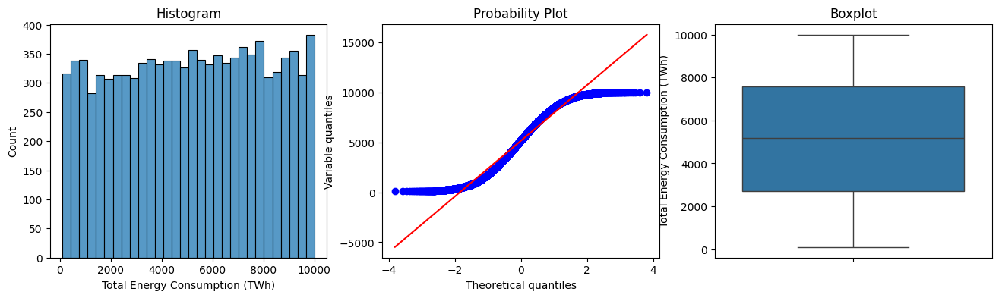

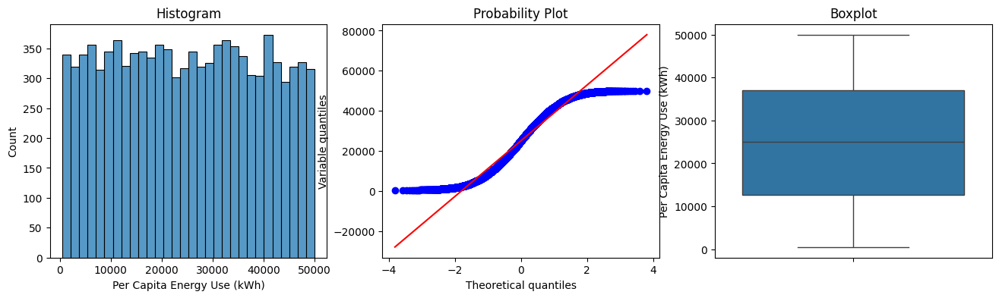

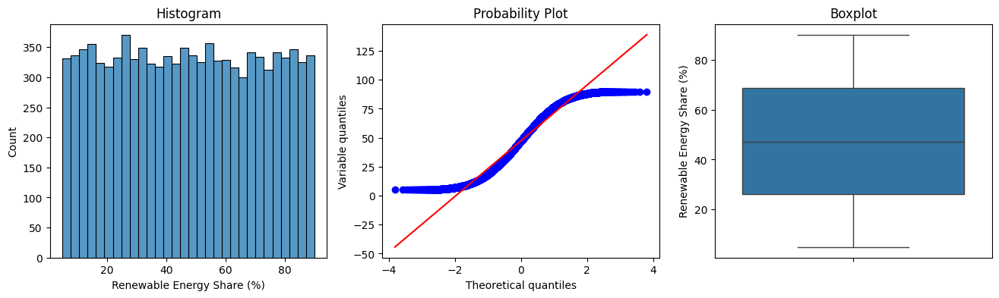

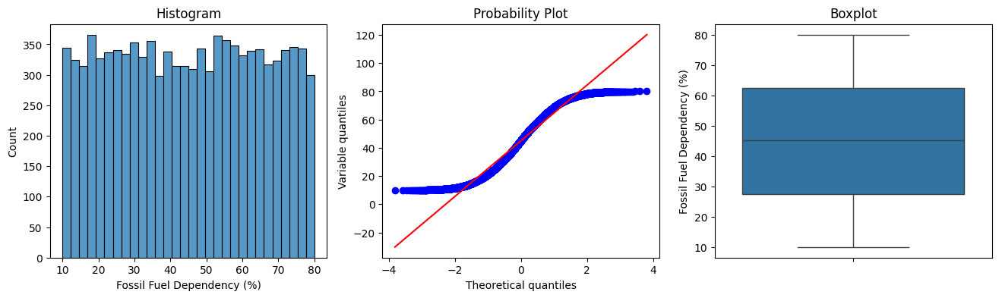

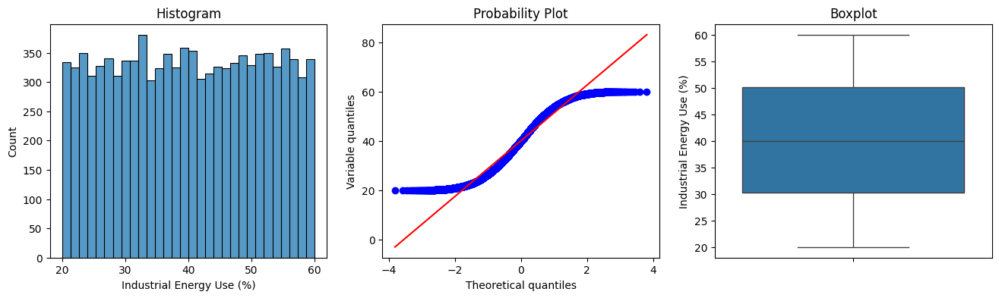

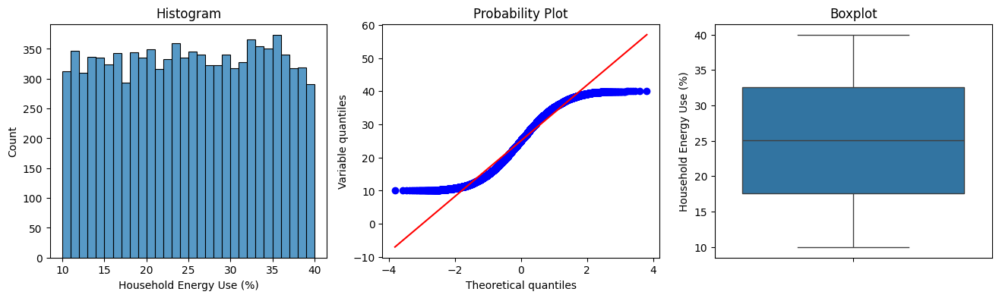

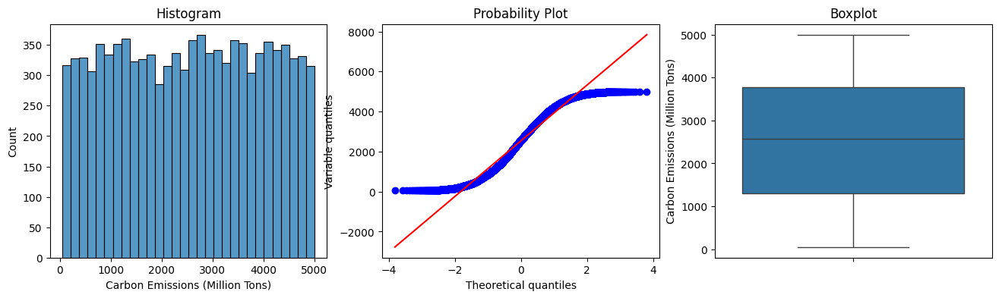

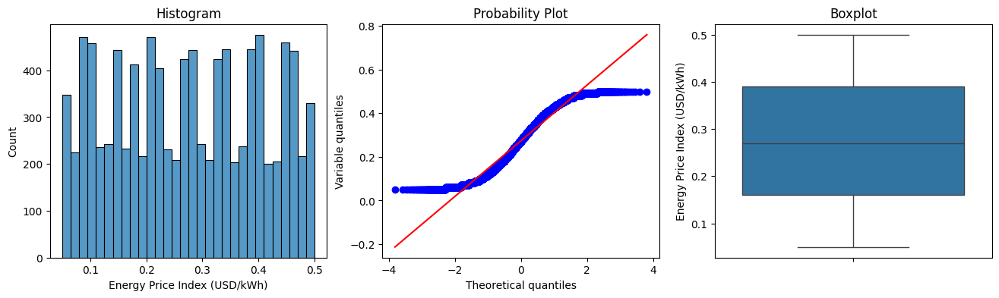

In [ ]:
# memvisualisasikan data numericals untuk mengecek apakah ada outliers
for col in numericals:
  check_plot(energy, col)


###**Notes After Cleaning and Handling:**

1. Hasil pengecekan duplicates menunjukkan bahwa hasilnya 1.0 --> artinya di data ini tidak ada duplicates data, sehingga **tidak perlu duplicates handling**. Namun, **karena setap tahun di setiap negara terdapat lebih dari 1 input, maka perlu di handling** dengan merata-ratakannya. Sehingga ini akan lebih mudah digunakan untuk forecast dan segmentasi.
2. **Tidak terdapat missing value** di semua kolom.
3. **Tidak perlu dilakukan outliers handling pada semua kolom** karena semua data sudah terdistibusi dengan sangat baik.

## **Get the Insight from Data**

#### **1. Tren konsumsi energi dari waktu ke waktu**

In [ ]:
# Filter kolom yang diperlukan
cols_trend = ['Country', 'Year', 'Renewable Energy Share (%)', 'Fossil Fuel Dependency (%)']
trend = energy[cols_trend]

In [ ]:
# Grouping data berdasarkan konsumsi Renewables vs Fossil
trend_energy = trend.groupby(['Year'])[['Renewable Energy Share (%)', 'Fossil Fuel Dependency (%)']].mean().reset_index()
trend_energy.head()

,Year,Renewable Energy Share (%),Fossil Fuel Dependency (%)
0,2000,48.543263,45.155895
1,2001,49.247023,45.917405
2,2002,45.772177,44.483575
3,2003,47.445650,44.887000
4,2004,46.401471,44.978824


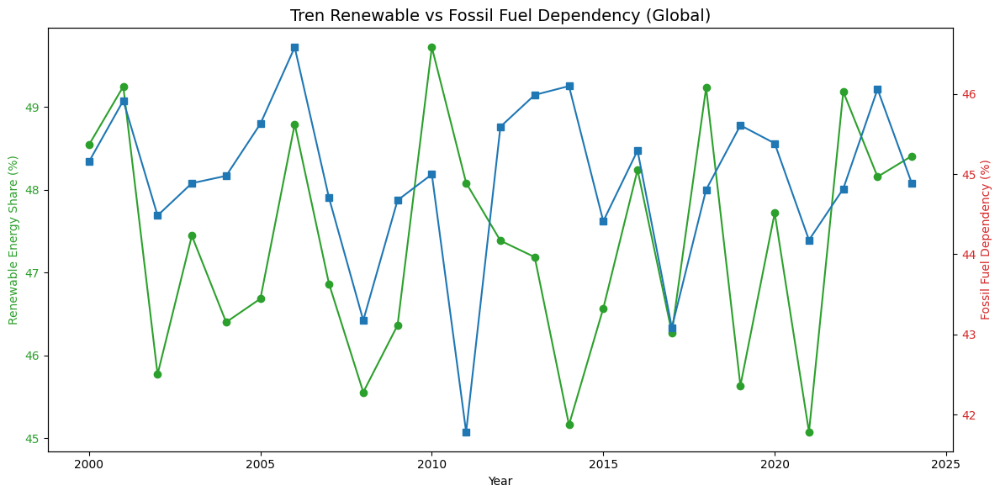

In [ ]:
# Plot tren global
fig, ax1 = plt.subplots(figsize=(12,6))

ax1.set_xlabel('Year')
ax1.set_ylabel('Renewable Energy Share (%)', color='tab:green')
ax1.plot(trend_energy['Year'], trend_energy['Renewable Energy Share (%)'], color='tab:green', marker='o', label='Renewable Share')
ax1.tick_params(axis='y', labelcolor='tab:green')

# Twin axis untuk fossil
ax2 = ax1.twinx()
ax2.set_ylabel('Fossil Fuel Dependency (%)', color='tab:red')
ax2.plot(trend_energy['Year'], trend_energy['Fossil Fuel Dependency (%)'], color='tab:blue', marker='s', label='Fossil Dependency')
ax2.tick_params(axis='y', labelcolor='tab:red')

plt.title('Tren Renewable vs Fossil Fuel Dependency (Global)', fontsize=14)
fig.tight_layout()
plt.show()

Terlihat bahwa grafik menunjukkan tren berjalan up and down setiap tahunnya untuk konsumsi kedua energi, serta cenderung tidak ada yang mendominasi. Namun hal ini tentu perlu di cek kembali seperti dengan pie chart atau table menghitung proporsi keduanya..

#### **2. Segmentation dengan K-Means Clustering**

Untuk Segmentasi akan menggunakan data rata-rata per tahun tiap negara.


**Menghitung Metrik Segmentasi (R, F, M) dari Data Tahunan yang telah di rata-rata**

In [ ]:
# R (Recency): Perubahan Renewable Energy Share (2024 vs 2000)

# Ambil data tahun awal dan akhir yang tersedia untuk setiap negara
# Jika ada negara yang tidak memiliki data tahun 2000 atau 2024, perubahan akan menjadi NaN
recency_start = energy_mean[energy_mean['Year'] == 2000][['Country', 'Renewable Energy Share (%)']]
recency_end = energy_mean[energy_mean['Year'] == 2024][['Country', 'Renewable Energy Share (%)']]

# Menggabungkan data tahun awal dan akhir
recency_merged = pd.merge(recency_end, recency_start, on='Country', suffixes=('_2024', '_2000'), how='left')
recency_merged.head()

,Country,Renewable Energy Share (%)_2024,Renewable Energy Share (%)_2000
0,Australia,49.571136,51.231026
1,Brazil,51.727179,48.048125
2,Canada,46.182143,53.069773
3,China,48.465263,46.424318
4,Germany,48.128621,44.754571


In [ ]:
#Menghitung selisih penggunaan energi renewable
recency_metric = recency_merged['Renewable Energy Share (%)_2024'] - recency_merged['Renewable Energy Share (%)_2000']

# Untuk menangani country yang tidak ada data 2000/2024
recency_metric = recency_metric.fillna(0)
recency_metric = pd.DataFrame({'Country': recency_merged['Country'], 'Recency_Change': recency_metric})

recency_metric.head()

,Country,Recency_Change
0,Australia,-1.659889
1,Brazil,3.679054
2,Canada,-6.887630
3,China,2.040945
4,Germany,3.374049


In [ ]:
# F (Frequency): Fluktuasi Ketergantungan Bahan Bakar Fosil (Standar Deviasi)

# Hitung standar deviasi untuk setiap negara dari seluruh tahun yang tersedia
frequency_metric = energy_mean.groupby('Country')['Fossil Fuel Dependency (%)'].std().fillna(0).reset_index()
frequency_metric.rename(columns={'Fossil Fuel Dependency (%)': 'Frequency_Fluctuation'}, inplace=True)

frequency_metric.head()

,Country,Frequency_Fluctuation
0,Australia,3.017419
1,Brazil,3.246280
2,Canada,3.514355
3,China,2.660559
4,Germany,3.652736


In [ ]:
# M (Magnitude): Total Emisi Karbon (Jumlah Kumulatif)

# Jumlahkan emisi karbon untuk setiap negara dari seluruh tahun yang tersedia
magnitude_metric = energy_mean.groupby('Country')['Carbon Emissions (Million Tons)'].sum().reset_index()
magnitude_metric.rename(columns={'Carbon Emissions (Million Tons)': 'Magnitude_Emissions'}, inplace=True)

magnitude_metric.head()

,Country,Magnitude_Emissions
0,Australia,64471.884781
1,Brazil,63502.698286
2,Canada,63331.910389
3,China,65143.308815
4,Germany,62545.050523


In [ ]:
# Menggabungkan semua metrik ke dalam satu DataFrame
segmentation_energy = recency_metric.merge(frequency_metric, on='Country').merge(magnitude_metric, on='Country')

segmentation_energy

,Country,Recency_Change,Frequency_Fluctuation,Magnitude_Emissions
0,Australia,-1.659889,3.017419,64471.884781
1,Brazil,3.679054,3.246280,63502.698286
2,Canada,-6.887630,3.514355,63331.910389
3,China,2.040945,2.660559,65143.308815
4,Germany,3.374049,3.652736,62545.050523
5,India,3.730322,3.640137,63422.702658
6,Japan,2.703786,3.427605,63149.164976
7,Russia,2.804029,2.585069,62365.779961
8,UK,-10.529215,3.772425,63432.786179
9,USA,1.996369,3.318391,62713.560681


**Normalisasi Data**

In [ ]:
# Normalisasi data agar setiap kolom memiliki skala yang sama
scaler = StandardScaler()
scaled_data = scaler.fit_transform(segmentation_energy[['Recency_Change', 'Frequency_Fluctuation', 'Magnitude_Emissions']])

scaled_data

array([[-0.37795794, -0.68115808,  1.31580013],
       [ 0.75247096, -0.09527696,  0.11725159],
       [-1.4848415 ,  0.59099202, -0.09395398],
       [ 0.40562964, -1.59471415,  2.14611948],
       [ 0.68789139,  0.94524608, -1.06702754],
       [ 0.76332596,  0.91299083,  0.01832466],
       [ 0.54597469,  0.36891361, -0.31994686],
       [ 0.56719955, -1.78796627, -1.28872323],
       [-2.25588413,  1.25164649,  0.03079449],
       [ 0.39619138,  0.08932643, -0.85863874]])

**K-Mean Clustering**

In [ ]:
# Menentukan jumlah klaster
n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)

In [ ]:
# Hasil klasterisasi dari K-Means
segmentation_energy['Cluster'] = kmeans.fit_predict(scaled_data)
segmentation_energy.head()

,Country,Recency_Change,Frequency_Fluctuation,Magnitude_Emissions,Cluster
0,Australia,-1.659889,3.017419,64471.884781,0
1,Brazil,3.679054,3.246280,63502.698286,1
2,Canada,-6.887630,3.514355,63331.910389,2
3,China,2.040945,2.660559,65143.308815,0
4,Germany,3.374049,3.652736,62545.050523,1


In [ ]:
# Memberi nama di setiap cluster
cluster_names = {
    0: 'Fossil Fuel Reliants',
    1: 'Green Pioneers',
    2: 'Developing Transformers',
    3: 'Energy Savers'}

In [ ]:
# Tambahkan kolom baru 'Cluster_Label' dengan nama-nama tersebut
segmentation_energy['Cluster_Label'] = segmentation_energy['Cluster'].map(cluster_names)

# Tampilkan hasilnya
print(segmentation_energy.head())

# Menyimpan hasil segmentasi ke file CSV baru untuk diimpor ke Power BI
segmentation_energy.to_csv('countries_segmented_kmeans.csv', index=False)
print("\nHasil segmentasi disimpan ke 'countries_segmented_kmeans.csv'.")

     Country  Recency_Change  Frequency_Fluctuation  Magnitude_Emissions  \
0  Australia       -1.659889               3.017419         64471.884781   
1     Brazil        3.679054               3.246280         63502.698286   
2     Canada       -6.887630               3.514355         63331.910389   
3      China        2.040945               2.660559         65143.308815   
4    Germany        3.374049               3.652736         62545.050523   

   Cluster            Cluster_Label  
0        0     Fossil Fuel Reliants  
1        1           Green Pioneers  
2        2  Developing Transformers  
3        0     Fossil Fuel Reliants  
4        1           Green Pioneers  

Hasil segmentasi disimpan ke 'countries_segmented_kmeans.csv'.


**Visualisasi K-Means Clustering**

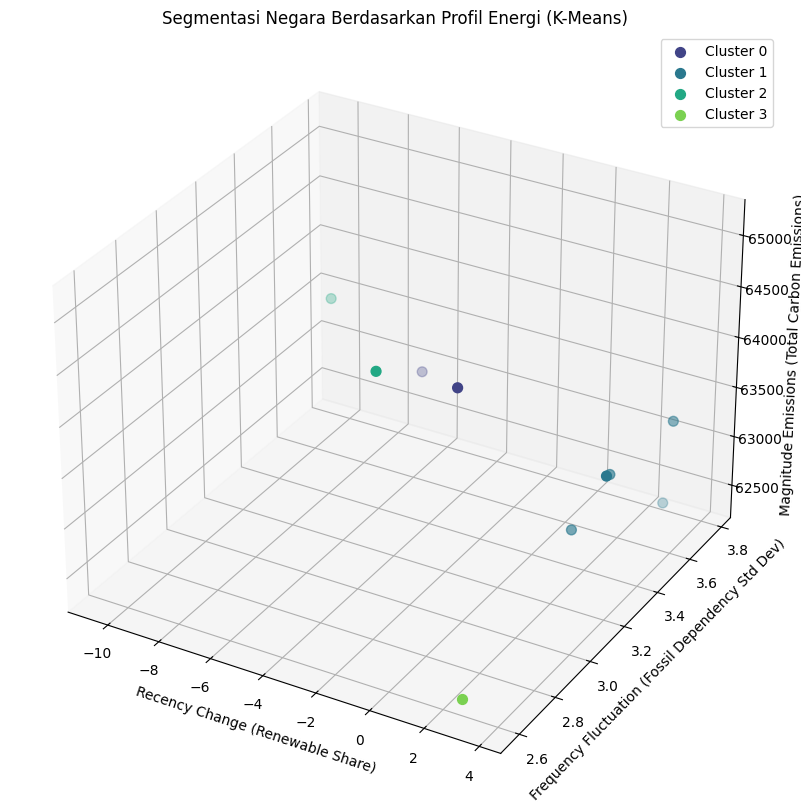

In [ ]:
# --- Visualisasi 3D Scatter Plot ---
# Kita akan memplot 3 metrik (Recency, Frequency, Magnitude) dan mewarnainya berdasarkan klaster

fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d') # Membuat subplot 3D

# Mengatur palet warna
colors = sns.color_palette("viridis", n_colors=segmentation_energy['Cluster'].nunique())

# Loop untuk setiap klaster dan plot titik datanya
for cluster_id in sorted(segmentation_energy['Cluster'].unique()):
    cluster_data = segmentation_energy[segmentation_energy['Cluster'] == cluster_id]
    ax.scatter(cluster_data['Recency_Change'],
               cluster_data['Frequency_Fluctuation'],
               cluster_data['Magnitude_Emissions'],
               color=colors[cluster_id],
               label=f'Cluster {cluster_id}',
               s=50) # Ukuran titik

ax.set_xlabel('Recency Change (Renewable Share)')
ax.set_ylabel('Frequency Fluctuation (Fossil Dependency Std Dev)')
ax.set_zlabel('Magnitude Emissions (Total Carbon Emissions)')
ax.set_title('Segmentasi Negara Berdasarkan Profil Energi (K-Means)')
ax.legend()
plt.show()

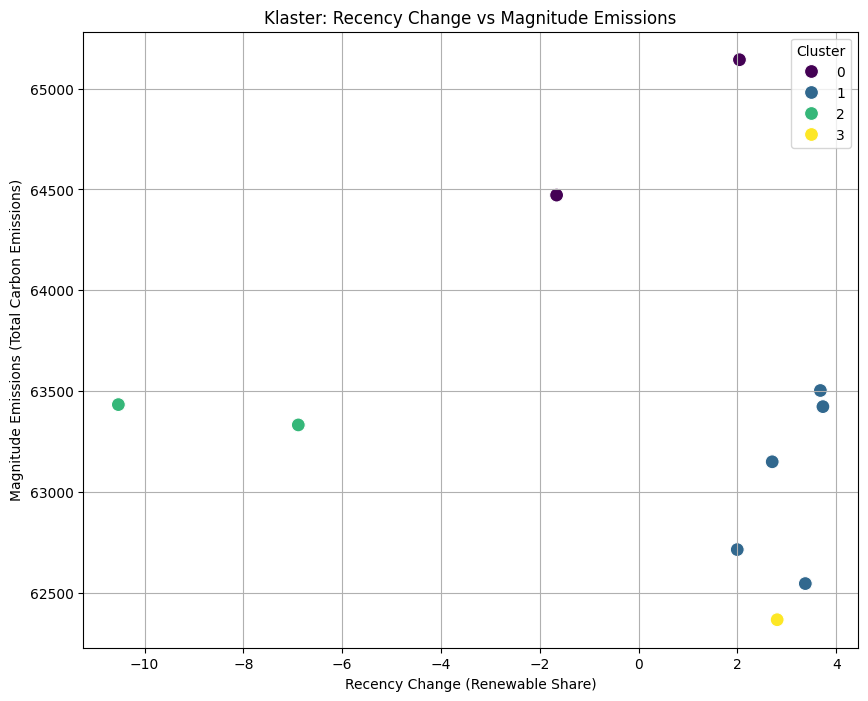

In [ ]:
# Visualisasi 2D Recency vs Magnitude
plt.figure(figsize=(10, 8))
sns.scatterplot(x='Recency_Change', y='Magnitude_Emissions', hue='Cluster',
                palette='viridis', data=segmentation_energy, s=100)
plt.title('Klaster: Recency Change vs Magnitude Emissions')
plt.xlabel('Recency Change (Renewable Share)')
plt.ylabel('Magnitude Emissions (Total Carbon Emissions)')
plt.grid(True)
plt.show()

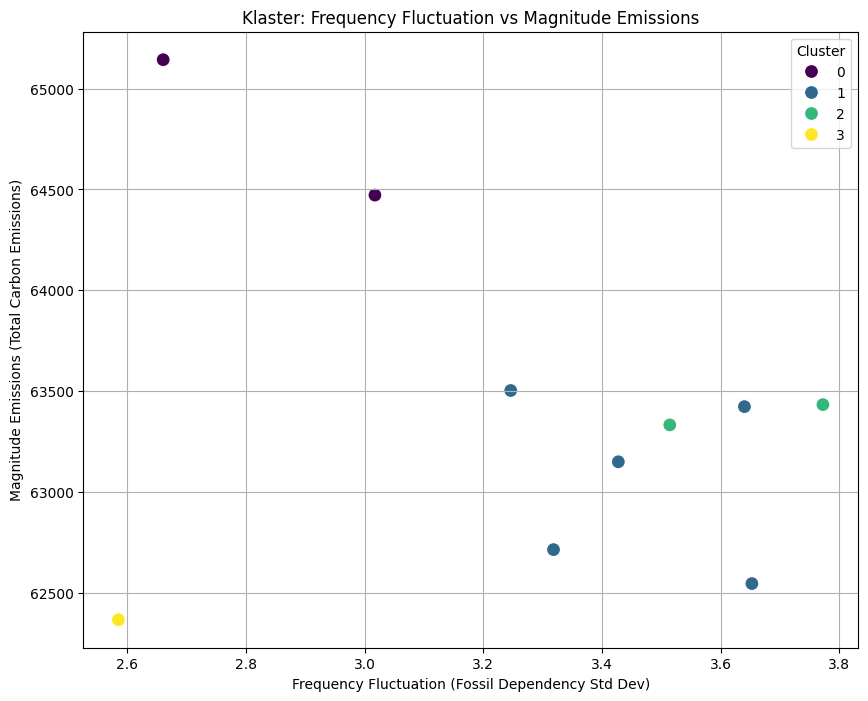

In [ ]:
# Visualisasi 2D Frequency vs Magnitude
plt.figure(figsize=(10, 8))
sns.scatterplot(x='Frequency_Fluctuation', y='Magnitude_Emissions', hue='Cluster',
                palette='viridis', data=segmentation_energy, s=100)
plt.title('Klaster: Frequency Fluctuation vs Magnitude Emissions')
plt.xlabel('Frequency Fluctuation (Fossil Dependency Std Dev)')
plt.ylabel('Magnitude Emissions (Total Carbon Emissions)')
plt.grid(True)
plt.show()

#### **3. Apakah ada korelasi antara konsumsi energy dengan carbon emission**

In [ ]:
#Hitung korelasi Pearson
corr_value_fossil = energy['Fossil Fuel Dependency (%)'].corr(energy['Carbon Emissions (Million Tons)'])

print(f"Koefisien Korelasi (Pearson) antara Fossil Fuel Dependency dan Carbon Emissions: {corr_value_fossil:.2f}")

Koefisien Korelasi (Pearson) antara Fossil Fuel Dependency dan Carbon Emissions: 0.00


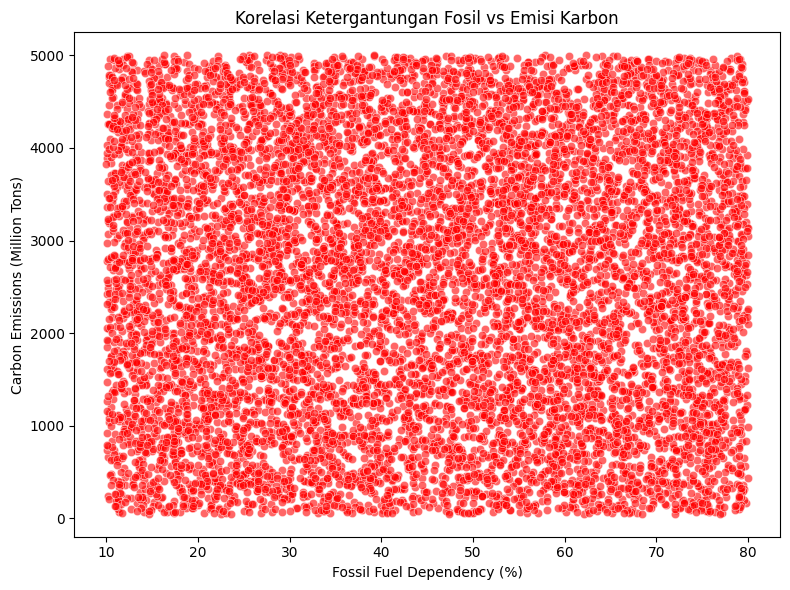

In [ ]:
# Scatter plot
plt.figure(figsize=(8,6))
sns.scatterplot(
    x='Fossil Fuel Dependency (%)',
    y='Carbon Emissions (Million Tons)',
    data=energy,
    alpha=0.6,
    color='red'
)

plt.title('Korelasi Ketergantungan Fosil vs Emisi Karbon')
plt.xlabel('Fossil Fuel Dependency (%)')
plt.ylabel('Carbon Emissions (Million Tons)')
plt.tight_layout()
plt.show()

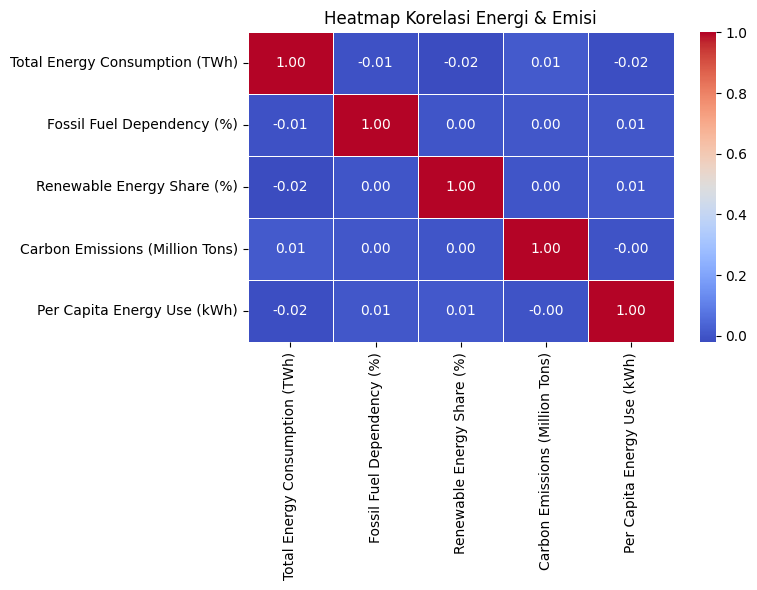

In [ ]:
selected_cols = [
    'Total Energy Consumption (TWh)',
    'Fossil Fuel Dependency (%)',
    'Renewable Energy Share (%)',
    'Carbon Emissions (Million Tons)',
    'Per Capita Energy Use (kWh)'
]

corr_matrix = energy[selected_cols].corr()

plt.figure(figsize=(8,6))
sns.heatmap(
    corr_matrix,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=0.5
)
plt.title('Heatmap Korelasi Energi & Emisi')
plt.tight_layout()
plt.show()


Simpulan:

1. Tidak ada hubungan linear yang signifikan antara variabel.
2. Fossil Fuel Dependency (%) dan Carbon Emissions (Million Tons) ternyata hampir tidak berkorelasi langsung dalam dataset ini (nilai 0).
3. Hubungan antara Renewable Energy Share (%) dan Carbon Emissions juga nyaris 0, jadi pergeseran ke energi terbarukan tidak terlihat jelas efeknya terhadap emisi secara linear di data ini.
4. Total Energy Consumption (TWh) juga tidak terlalu berhubungan dengan emisi atau per kapita, berarti faktor lain (misalnya efisiensi teknologi, bauran energi, atau kebijakan negara) mungkin lebih dominan mempengaruhi emisi.

#### **4. Annual Growth**

In [ ]:
# Mengurutkan berdasarkan 'Country' dan 'Year'
energy_mean = energy_mean.sort_values(by=['Country', 'Year'])

In [ ]:
# Menghitung laju pertumbuhan tahunan (Year-over-Year)
# Menggunakan .pct_change() dalam setiap grup negara
energy_mean['Annual Growth Rate (%)'] = energy_mean.groupby('Country')['Total Energy Consumption (TWh)'].pct_change() * 100

In [ ]:
# Menghitung rata-rata laju pertumbuhan untuk setiap negara untuk merangkumnya ke dalam satu angka pertumbuhan di tiap negara
annual_growth = energy_mean.groupby('Country')['Annual Growth Rate (%)'].mean().reset_index()

# Menghapus baris yang memiliki nilai NaN (negara yang hanya punya 1 tahun data)
annual_growth.dropna(inplace=True)

annual_growth

,Country,Annual Growth Rate (%)
0,Australia,1.938348
1,Brazil,2.330409
2,Canada,0.296870
3,China,1.173566
4,Germany,0.869581
5,India,0.482560
6,Japan,1.085475
7,Russia,2.212714
8,UK,0.727110
9,USA,-0.287794


#### **5. Forecast konsumsi energi global**

In [ ]:
# Filter data global
df_global = energy.groupby('Year')['Total Energy Consumption (TWh)'].sum().reset_index()

In [ ]:
# Rename sesuai format Prophet
df_prophet = df_global.rename(columns={'Year': 'ds', 'Total Energy Consumption (TWh)': 'y'})

# Prophet hanya mau datetime, ubah Year jadi datetime
df_prophet['ds'] = pd.to_datetime(df_prophet['ds'], format='%Y')

df_prophet.head()

,ds,y
0,2000-01-01,1818935.94
1,2001-01-01,1974854.60
2,2002-01-01,1908410.61
3,2003-01-01,2092794.51
4,2004-01-01,1994830.95


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 19.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvb55yd9e/d0t91wss.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpvb55yd9e/45ph0ezv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40751', 'data', 'file=/tmp/tmpvb55yd9e/d0t91wss.json', 'init=/tmp/tmpvb55yd9e/45ph0ezv.json', 'output', 'file=/tmp/tmpvb55yd9e/prophet_modelhqbtclly/prophet_model-20250815130105.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
13:01:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:01:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:

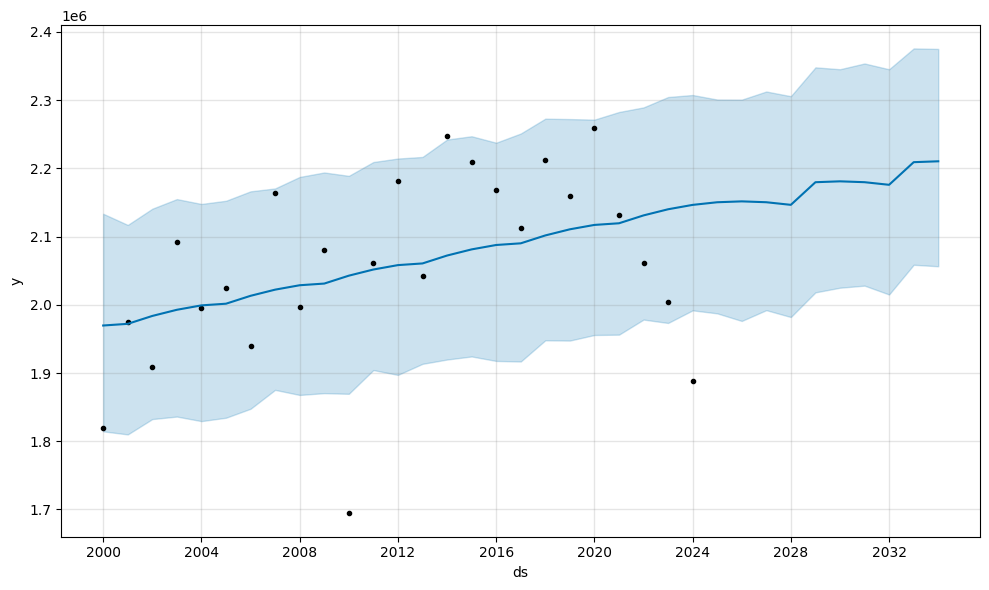

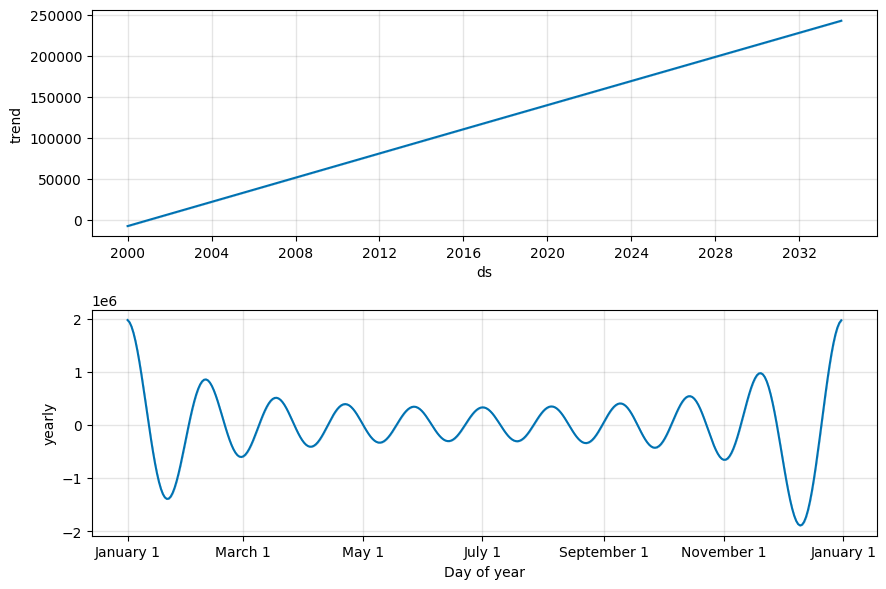

In [ ]:
# Model
model = Prophet()
model.fit(df_prophet)

# Forecast 10 tahun ke depan
future = model.make_future_dataframe(periods=10, freq='Y')
forecast = model.predict(future)

# Plot
fig1 = model.plot(forecast)
fig2 = model.plot_components(forecast)

**Forecast Global dengan ARIMA**

In [ ]:
# Pra-pemrosesan Data dari data yang telah di grouping
data_ts = df_global[['Year', 'Total Energy Consumption (TWh)']].copy()
data_ts['Year'] = pd.to_datetime(data_ts['Year'], format='%Y')
data_ts.set_index('Year', inplace=True)
data_ts.dropna(inplace=True)

data_ts.head()

,Total Energy Consumption (TWh)
Year,
2000-01-01,1818935.94
2001-01-01,1974854.60
2002-01-01,1908410.61
2003-01-01,2092794.51
2004-01-01,1994830.95


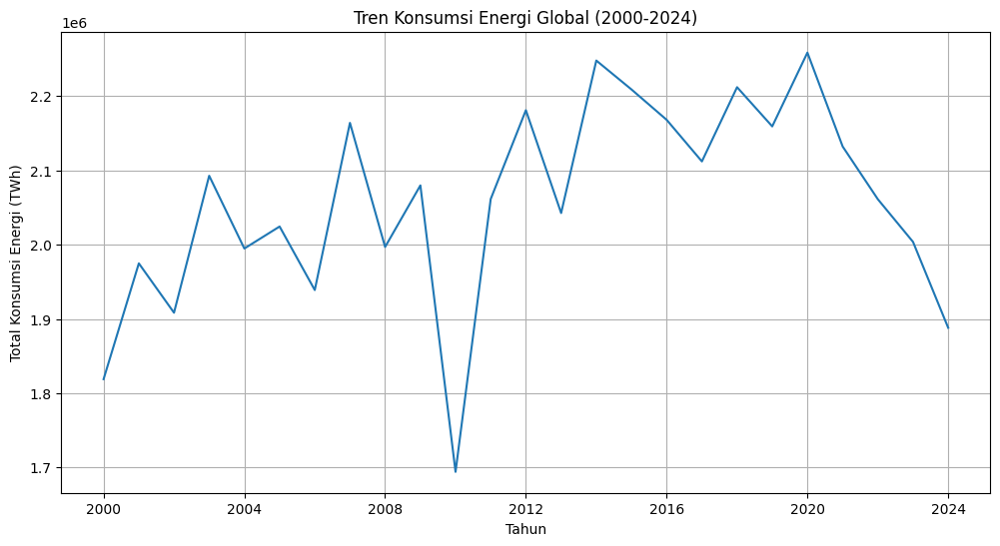

In [ ]:
# Visualisasi Data Runtun Waktu Global
plt.figure(figsize=(12, 6))
plt.plot(data_ts)
plt.title('Tren Konsumsi Energi Global (2000-2024)')
plt.xlabel('Tahun')
plt.ylabel('Total Konsumsi Energi (TWh)')
plt.grid(True)
plt.show()

In [ ]:
# Uji Stationarity (Tes ADF)
print("\n--- Hasil Uji Stasionaritas (Tes ADF) ---")
result = adfuller(data_ts['Total Energy Consumption (TWh)'])
print(f"P-Value: {result[1]:.4f}")

d_param = 1 if result[1] > 0.05 else 0
print(f"Parameter differencing (d) yang digunakan: {d_param}")


--- Hasil Uji Stasionaritas (Tes ADF) ---
P-Value: 0.0042
Parameter differencing (d) yang digunakan: 0


In [ ]:
# Menentukan parameter ARIMA (p, d, q)
p_param = 1
q_param = 1
print(f"\nParameter ARIMA yang dipilih: p={p_param}, d={d_param}, q={q_param}")


Parameter ARIMA yang dipilih: p=1, d=0, q=1


In [ ]:
# Membangun dan melatih model ARIMA
model = ARIMA(data_ts, order=(p_param, d_param, q_param))
model_fit = model.fit()

In [ ]:
# Melakukan Forecasting (Prediksi)
n_forecast = 10
forecast = model_fit.get_forecast(steps=n_forecast)
forecast_values = forecast.predicted_mean
confidence_intervals = forecast.conf_int()
forecast_index = pd.to_datetime(range(2025, 2025 + n_forecast), format='%Y')

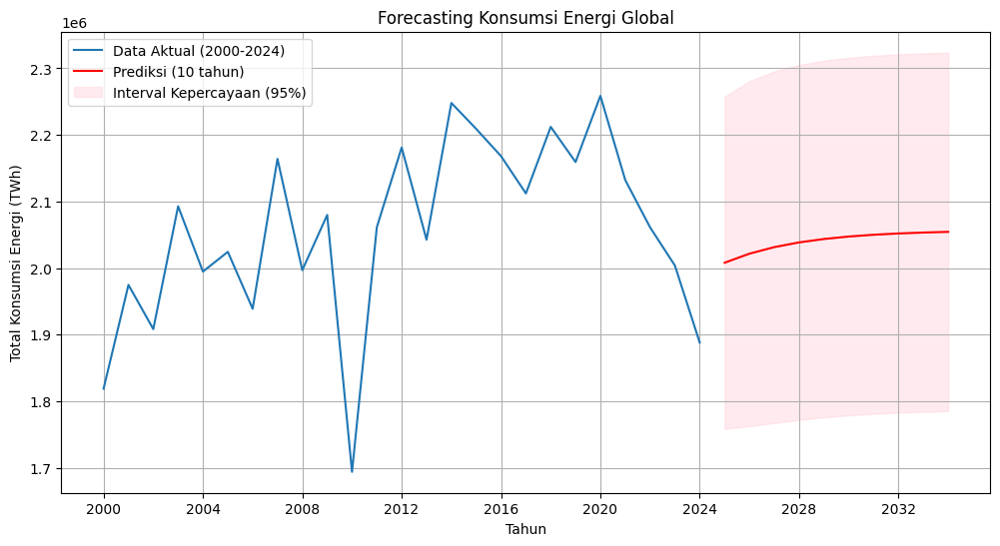

In [ ]:
# Visualisasi Hasil Forecasting
plt.figure(figsize=(12, 6))
plt.plot(data_ts, label='Data Aktual (2000-2024)')
plt.plot(forecast_index, forecast_values, color='red', label=f'Prediksi ({n_forecast} tahun)')
plt.fill_between(forecast_index,
                 confidence_intervals.iloc[:, 0],
                 confidence_intervals.iloc[:, 1],
                 color='pink', alpha=0.3, label='Interval Kepercayaan (95%)')
plt.title('Forecasting Konsumsi Energi Global')
plt.xlabel('Tahun')
plt.ylabel('Total Konsumsi Energi (TWh)')
plt.legend()
plt.grid(True)
plt.show()